In [1]:
# Carga de módulos

import pandas as pd
import geopandas as gpd
import matplotlib.pyplot as plt
import seaborn as sns
import statsmodels.api as sm
from google.colab import drive

In [2]:
# Configuración de Google Drive

drive.mount('/content/drive')

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).


In [3]:
# Ruta completa del archivo de mapa

ruta = '/content/drive/MyDrive/GEOAES_25/Mapas/México_ent/00ent'

In [4]:
# 1 Función de normalización (guárdala, la usarás siempre)

import unicodedata

def normaliza_entidad(texto):
    if pd.isna(texto):
        return texto
    texto = str(texto).strip().upper()
    texto = ''.join(
        c for c in unicodedata.normalize('NFD', texto)
        if unicodedata.category(c) != 'Mn'
    )
    return texto

# Convierte:
# "México" → "MEXICO"
# "Ciudad de México" → "CIUDAD DE MEXICO"


In [5]:
# cargar mapa

Mapa = gpd.read_file(ruta + '.shp')
Mapa.tail(5)

,CVEGEO,CVE_ENT,NOMGEO,geometry
27,28,28,Tamaulipas,"POLYGON ((2723631.021 1736758.631, 2723715.07 ..."
28,29,29,Tlaxcala,"POLYGON ((2912008.539 864103.572, 2912035.825 ..."
29,30,30,Veracruz de Ignacio de la Llave,"MULTIPOLYGON (((3119599.686 810246.093, 311958..."
30,31,31,Yucatán,"MULTIPOLYGON (((3511760.832 1023282.324, 35117..."
31,32,32,Zacatecas,"POLYGON ((2470352.986 1453426.983, 2473254.843..."


In [ ]:
Mapa

In [6]:
# Carga de datos de adolescentes privados de la libertad

ruta = '/content/drive/MyDrive/GEOAES_25/Bases/Est_adoles.csv'

Data = pd.read_csv(ruta, encoding='cp1252')
Data.head(5)

,Ano,Clave_Ent,Entidad,Delito,Val_Abs,Val_Rel
0,2023,1,Aguascalientes,Robo,45,17.44%
1,2023,2,Baja California,Robo,3,5.56%
2,2023,3,Baja California Sur,Robo,1,50.00%
3,2023,4,Campeche,Robo,29,64.44%
4,2023,5,Coahuila de Zaragoza,Robo,6,4.65%


In [7]:
Data.shape

(320, 6)

In [ ]:
len(Data)

In [ ]:
len(Data.columns)

In [ ]:
Data.columns

In [ ]:
Data.dtypes

In [8]:
#Aplicar normalización antes del groupby

Data['Entidad_norm'] = Data['Entidad'].apply(normaliza_entidad)
Mapa['Entidad_norm'] = Mapa['NOMGEO'].apply(normaliza_entidad)


In [10]:
# Limpieza y conversión antes de agrupar
# Este bloque corrige el problema de raíz:

# Eliminar comas y espacios
Data['Val_Abs'] = (
    Data['Val_Abs']
    .astype(str)
    .str.replace(',', '', regex=False)
    .str.strip()
)

Data['Val_Rel'] = (
    Data['Val_Rel']
    .astype(str)
    .str.replace(',', '', regex=False)
    .str.strip()
)

# Convertir a numérico (lo que no se pueda → NaN)
Data['Val_Abs'] = pd.to_numeric(Data['Val_Abs'], errors='coerce')
Data['Val_Rel'] = pd.to_numeric(Data['Val_Rel'], errors='coerce')

# (debería de ver float64 o int64 si no hay NaN).


In [11]:
Data.dtypes


,0
Ano,int64
Clave_Ent,int64
Entidad,object
Delito,object
Val_Abs,float64
Val_Rel,float64
Entidad_norm,object


In [9]:
# Recomendación final (best practice)
# Antes de cualquier groupby en tus scripts:

Data[['Val_Abs', 'Val_Rel']] = (
    Data[['Val_Abs', 'Val_Rel']]
    .replace({',': ''}, regex=True)
    .apply(pd.to_numeric, errors='coerce')
)


In [12]:
# Ahora sí: agregación correcta

Data_total = (
    Data
    .groupby('Entidad_norm', as_index=False)
    .agg(
        Total_Abs=('Val_Abs', 'sum'),
        Total_Rel=('Val_Rel', 'sum')
    )
)


In [13]:
Data_total.head()

,Entidad_norm,Total_Abs,Total_Rel
0,AGUASCALIENTES,258.0,0.0
1,BAJA CALIFORNIA,54.0,0.0
2,BAJA CALIFORNIA SUR,2.0,0.0
3,CAMPECHE,45.0,0.0
4,CHIAPAS,499.0,0.0


In [ ]:
Data_total

In [14]:
# Fusionar con el mapa

Mapa = Mapa.merge(
    Data_total,
    on='Entidad_norm',
    how='left'
)


In [15]:
Mapa.head()

,CVEGEO,CVE_ENT,NOMGEO,geometry,Entidad_norm,Total_Abs,Total_Rel
0,01,01,Aguascalientes,"POLYGON ((2469550.852 1159302.643, 2469738.209...",AGUASCALIENTES,258.0,0.0
1,02,02,Baja California,"MULTIPOLYGON (((1313480.513 1831458.607, 13135...",BAJA CALIFORNIA,54.0,0.0
2,03,03,Baja California Sur,"MULTIPOLYGON (((1694656.345 1227647.637, 16946...",BAJA CALIFORNIA SUR,2.0,0.0
3,04,04,Campeche,"MULTIPOLYGON (((3544897.199 946994.621, 354491...",CAMPECHE,45.0,0.0
4,05,05,Coahuila de Zaragoza,"POLYGON ((2469501.165 1978862.429, 2469539.651...",COAHUILA DE ZARAGOZA,129.0,0.0


In [16]:
# Verificar 32 filas

Mapa.shape

(32, 7)

In [17]:
Mapa

,CVEGEO,CVE_ENT,NOMGEO,geometry,Entidad_norm,Total_Abs,Total_Rel
0,01,01,Aguascalientes,"POLYGON ((2469550.852 1159302.643, 2469738.209...",AGUASCALIENTES,258.0,0.0
1,02,02,Baja California,"MULTIPOLYGON (((1313480.513 1831458.607, 13135...",BAJA CALIFORNIA,54.0,0.0
2,03,03,Baja California Sur,"MULTIPOLYGON (((1694656.345 1227647.637, 16946...",BAJA CALIFORNIA SUR,2.0,0.0
3,04,04,Campeche,"MULTIPOLYGON (((3544897.199 946994.621, 354491...",CAMPECHE,45.0,0.0
4,05,05,Coahuila de Zaragoza,"POLYGON ((2469501.165 1978862.429, 2469539.651...",COAHUILA DE ZARAGOZA,129.0,0.0
5,06,06,Colima,"MULTIPOLYGON (((1157633.318 768573.525, 115772...",COLIMA,35.0,0.0
6,07,07,Chiapas,"POLYGON ((3558179.782 698365.65, 3558487.689 6...",CHIAPAS,499.0,0.0
7,08,08,Chihuahua,"POLYGON ((1961978.327 2201082.365, 1961978.967...",CHIHUAHUA,68.0,0.0
8,09,09,Ciudad de México,"POLYGON ((2802175.66 843326.718, 2801806.564 8...",CIUDAD DE MEXICO,2157.0,0.0
9,10,10,Durango,"POLYGON ((2107050.444 1641943.398, 2109767.527...",DURANGO,10.0,0.0


<Figure size 7500x6000 with 0 Axes>

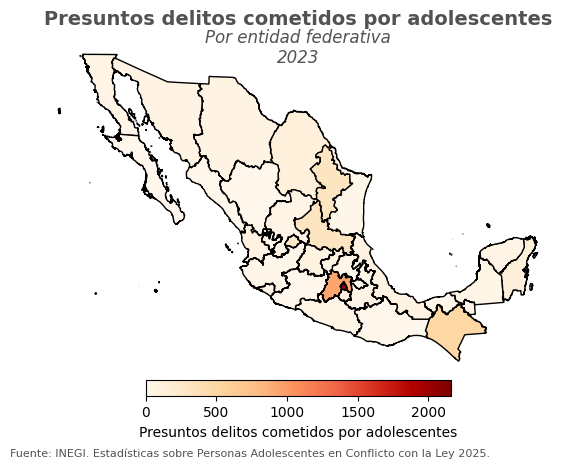

In [27]:
# Mapa temático con variable continua

plt.figure(figsize=(15,12), dpi = 500)
Mapa.plot(
    column = 'Total_Abs',
    legend = True,
    cmap = 'OrRd',
    legend_kwds = {'label': "Presuntos delitos cometidos por adolescentes",
                   'orientation': 'horizontal',
                   'shrink': 0.5, # Reduce el tamaño a la mitad
                   'pad': 0.01}, #Acercar leyenda al mapa
    edgecolor = "black"
)
plt.axis('off') # Quita los ejes
plt.figtext(0.5, 0.95, "Presuntos delitos cometidos por adolescentes",
            fontweight = 'bold',
            color = "#525252",
            ha = 'center',
            fontsize = 14) # Titulo
plt.figtext(0.5, 0.87, "Por entidad federativa\n2023",
            style = "italic",
            color = "#525252",
            ha = 'center',
            fontsize = 12) # Subtitulo
plt.figtext(0.05, 0.05, "Fuente: INEGI. Estadísticas sobre Personas Adolescentes en Conflicto con la Ley 2025.",
            color = "#525252",
            fontsize = 8) # Pie de gráfico
plt.grid(False)
plt.tight_layout(rect = [0,0.05,1,0.95])
ruta_guardado ='/content/drive/MyDrive/GEOAES_25/Salidas/Mapa_del_adol_cont.png'
plt.savefig(ruta_guardado, dpi = 500, bbox_inches = 'tight', facecolor = 'white')
# plt.show()

<Figure size 7500x6000 with 0 Axes>

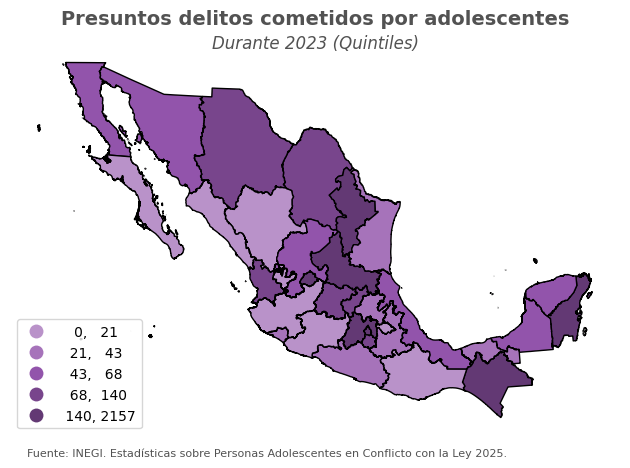

In [28]:
# Mapa temático con variable discreta
# Definición de paleta

from matplotlib.colors import ListedColormap

Colores = [
    "#B992C9",
    "#A673BA",
    "#9254AB",
    "#78458C",
    "#633974"
  ]

cmap_manual = ListedColormap(Colores)

# Mapa temático con variable discreta

plt.figure(figsize=(15,12), dpi = 500)
Mapa.plot(
    column = 'Total_Abs',
    scheme = 'Quantiles',
    k = 5,
    legend = True,
    cmap = cmap_manual,
    legend_kwds = {'loc': 'lower left',
                   'fmt': "{:.0f}"},
    edgecolor = "black"
)
plt.axis('off') # Quita los ejes
plt.figtext(0.5, 0.95, "Presuntos delitos cometidos por adolescentes",
            fontweight = 'bold',
            color = "#525252",
            ha = 'center',
            fontsize = 14) # Titulo
plt.figtext(0.5, 0.90, "Durante 2023 (Quintiles)",
            style = "italic",
            color = "#525252",
            ha = 'center',
            fontsize = 12) # Subtitulo
plt.figtext(0.05, 0.05, "Fuente: INEGI. Estadísticas sobre Personas Adolescentes en Conflicto con la Ley 2025.",
            color = "#525252",
            fontsize = 8) # Pie de gráfico
plt.grid(False)
plt.tight_layout(rect = [0,0.05,1,0.95])
ruta_guardado = '/content/drive/MyDrive/GEOAES_25/Salidas/Mapa_del_adol_disc.png'
plt.savefig(ruta_guardado, dpi = 500, bbox_inches = 'tight', facecolor = 'white')